In [3]:
import numpy as np
from scipy.signal import find_peaks
from scipy.ndimage import uniform_filter
from skimage import exposure
from numpy.ma import getdata
from skimage.filters import sobel
from skimage import filters
from matplotlib import pyplot as plt
import plotly.graph_objects as go
plt.style.use('dark_background')
import matplotlib as mpl
import warnings
warnings.filterwarnings("ignore") 
from tqdm import tqdm
from pypalettes import load_cmap
cmap = plt.get_cmap('Pastel1')
plt.get_cmap('Pastel1')
palette = load_cmap('Alexandrite')

Here we reconstruct the surface and save it in the `rmax_surface` variable, to project it in the FOV and benchmark it to the maximum intensity arc later.

In [4]:
import ReadCube as readcube
cube_MHD = readcube.Cube("MHD_OpenGGCM", step=0.05)
Q_MHD_GSE = cube_MHD.Q_GSE()
R, Theta, Phi, Q_MHD_sph = cube_MHD.cartesian_to_spherical(rmax = 15, dtheta = 0.5, dphi = 0.5)

# We do not discard something in particular here - some masking on the second peak will be done after we find the indexes
threshold = 10
r_skip = 0
print(f"Discard radius below {R[0, r_skip, 0]} Re and Emissivity above {threshold}")

# Prepare arrays to store up to two peak indices for each (theta, phi)
ind_peaks_below_thresh = np.full((Q_MHD_sph.shape[0], Q_MHD_sph.shape[2], 2), -1, dtype=int)

# Loop over theta and phi
for i_theta in range(Q_MHD_sph.shape[0]):
    for i_phi in range(Q_MHD_sph.shape[2]):
        profile = Q_MHD_sph[i_theta, r_skip:, i_phi]  # profile along r

        # Find local maxima
        peaks, _ = find_peaks(profile)

        # Filter by threshold
        peaks_below = peaks[profile[peaks] < threshold]

        # Sort peaks by their value (descending)
        if len(peaks_below) > 0:
            sorted_peaks = peaks_below[np.argsort(profile[peaks_below])[::-1]]
            # Keep up to two peaks
            for j, peak in enumerate(sorted_peaks[:2]):
                ind_peaks_below_thresh[i_theta, i_phi, j] = peak + r_skip

# Calculate the rmax surface for all (theta, phi) and peaks, and discards the ones that clip to the MHD mask
rmax_surface = np.full_like(R[:, 0, :], np.nan)
for i_theta in range(ind_peaks_below_thresh.shape[0]):
    for i_phi in range(ind_peaks_below_thresh.shape[1]):
        for j in range(2):
            idx = ind_peaks_below_thresh[i_theta, i_phi,j]
            if idx>20:
                rmax_surface[i_theta, i_phi] = R[i_theta, idx, i_phi]

Discard radius below 1.0 Re and Emissivity above 10


(tangent_results)=
# Results: Characterizing the Tangent Hypothesis

We can now derive diagnostics about the correlation of the maximum intensity curve of the image and the projected tangent points of the surface. We do this by calculating the RMSE between the two curves of each image. By taking a sequence of images over some key orbits we can understand how this error evolves depending on the geometry of observation. We run this test for a full orbit ($T = 50.3 \,hours$) per month, from June 2025 to May 2026. As described in {ref}`SMILE`, the orbit has an inclination of $73^\circ$, however the orientation of this inclination precesses and thus the geometry of observation changes seasonally. This in turn affects the projection of the magnetopause to the FOV as well as the tracing of the maximum intensity arc. We will look into this seasonal dependency of the tangent hypothesis, and will point out its limitations.


You can choose which folder-orbit you would like to analyze from the list below, or export your own data from 3DView and store them in a custom file:

In [5]:
# choose a month
jun_2025 = "01.06.2025-03.06.2025"
jul_2025 = "02.07.2025-04.07.2025"
aug_2025 = "01.08.2025-03.08.2025"
sept_2025 = "01.09.2025-03.09.2025"
oct_2025 = "01.10.2025-03.10.2025"
nov_2025 = "01.11.2025-03.11.2025"
dec_2025 = "01.12.2025-03.12.2025"
jan_2026 = "01.01.2026-03.01.2026"
feb_2026 = "01.02.2026-03.02.2026"
mar_2026 = "01.03.2026-03.03.2026"
apr_2026 = "01.04.2026-03.04.2026"
may_2026 = "01.05.2026-03.05.2026"

The script below encapsulates all the operations discussed in the previous sections 

In [6]:
# Convert satellite positions to spherical coordinates (r, theta, phi)
def cartesian_to_spherical_coords(xyz):
    x, y, z = xyz[:, 0], xyz[:, 1], xyz[:, 2]
    r = np.sqrt(x**2 + y**2 + z**2)
    theta = np.arccos(x / r)  # polar angle
    phi = np.arctan2(z, y)    # azimuthal angle
    return r, theta, phi

from TangentFitting import Images

def orbit(month):
    # Select orbit
    img = Images(folder_name = month)

    az_max = img.Az[-1, -1]
    az_min = img.Az[0, 0]
    el_max = img.El[-1, -1]
    el_min = img.El[0, 0]
    n = 10  # n rows and n columns

    fig, axes = plt.subplots(n, n, figsize=(14, 14))  # Bigger figure for clarity
    RMSE = np.zeros(n*n)
    z_sat = np.zeros(n*n)
    std_z = np.zeros(n*n)

    for i in tqdm(range(n * n)):
        row = i // n
        col = i % n
        ax = axes[row, col]
        img.choose_image(i)
        # Apply filter to the image
        img_array = np.array(getdata(img.image))
        equalized_image = exposure.equalize_hist(img_array)
        smoothed_eq_image = filters.gaussian(equalized_image, sigma=1)
        sobel = filters.sobel(img_array)

        # Find maximum intensity curve
        max_x = []
        y_vals = np.arange(img_array.shape[0])
        for y in y_vals:
            row = smoothed_eq_image[y, :]
            x = np.argmax(row)
            max_x.append(x)
        max_x = np.array(max_x)
        max_x_filtered = [max_x[0]]
        y_filtered = [y_vals[0]]
        for j in range(1, len(max_x)):
            if abs(max_x[j] - max_x_filtered[-1]) <= 3:  # Set tolerance for jumps
                max_x_filtered.append(max_x[j])
                y_filtered.append(y_vals[j])
        threshold = 0.2  # threshold for intensity of the curve (inside magnetopause low)
        curve_intensity = np.mean(img_array[y_vals, max_x])
        if curve_intensity < 0.3:
            y_filtered = []
            max_x_filtered = []
        if len(y_filtered) < 20:
            y_filtered = []
            max_x_filtered = []

        #Extract tangent points of cube magneotpause surface
        az_cube, el_cube, z_distance = img.surface_tangent_SXI(rmax_surface, Theta[:,0,:], Phi[:,0,:])
        az_cube = np.degrees(az_cube)
        el_cube = np.degrees(el_cube)
        # Convert to Az/El indices
        az_ind = ((az_cube - az_min) / (az_max - az_min) * (img.Az.shape[1] - 1))
        el_ind = ((el_cube - el_min) / (el_max - el_min) * (img.El.shape[0] - 1))
        az_ind = np.clip(az_ind.round().astype(int), 0, img.Az.shape[1] - 1)
        el_ind = np.clip(el_ind.round().astype(int), 0, img.El.shape[0] - 1)

        image_at_tangent_points = img.Az[y_filtered, max_x_filtered]
        image_at_Imax = img.Az[el_ind, az_ind]

        # Match the number of points — truncate to the shortest length
        N = min(len(image_at_tangent_points), len(image_at_Imax))
        if N>20:
            count = 0 
            Daz2=0
            for k in range(len(el_ind)):
                j = np.where(np.array(y_filtered) == el_ind[k])[0]
                if len(j)>0:
                    j = j[0]
                    Daz2 += (img.Az[el_ind[k],az_ind[k]]-img.Az[y_filtered[j],max_x_filtered[j]])**2
                    count += 1
                else:
                    continue
            RMSE[i]=np.sqrt(Daz2/count)
        else:
            RMSE[i]=None
        
        z_sat[i] = np.mean(z_distance)
        std_z[i] = np.std(z_distance)

        # Plot
        ax.pcolormesh(img.Az, img.El,img.image, cmap='viridis')
        ax.scatter(az_cube, el_cube, c='b', s=2)
        ax.axis('off')  # Hide axes for a cleaner look
        if np.isnan(RMSE[i]):
            ax.set_title(f"{i+1}. , RMSE = - ", fontsize=8)
        else:
            ax.set_title(f"{i+1}. , RMSE = {RMSE[i]:.2f}$^\circ$", fontsize=8)
        ax.plot(img.Az[y_filtered,max_x_filtered],img.El[y_filtered,max_x_filtered] , color='red', linewidth=1.5)

    plt.tight_layout()
    plt.show()  

    fig.show()
    ### RMSE - Oct 2025
    # Error in degrees and in RE
    Res_deg = img.Az[0,1] - img.Az[0,0]
    Res = np.deg2rad(Res_deg) 
    RMSE_px = RMSE / Res_deg
    dx = z_sat * np.tan(Res)
    std_dx = std_z * np.tan(Res)
    RMSE_RE = dx * RMSE_px
    std_RE = RMSE_px * std_dx

    fig, axs = plt.subplots(2, 1 , figsize=(10, 5), sharex=True)

    axs[0].plot(RMSE, 'o-', label='RMSE [deg]', color = palette(1))
    axs[0].set_ylabel('RMSE [deg]')
    axs[0].set_title('RMSE in Degrees')
    axs[0].legend()
    axs[0].grid(True)

    axs[1].plot(RMSE_RE, 'o-', color=palette(7), label='RMSE [RE]')
    axs[1].errorbar(np.arange(len(RMSE_RE)), RMSE_RE, yerr=std_RE, color=palette(7), label='Errors due to RE conversion')
    axs[1].set_xlabel('Elapsed time [hours] - Index')
    axs[1].set_ylabel('RMSE [RE]')
    axs[1].set_title('RMSE in RE')
    axs[1].legend()
    axs[1].grid(True)
    # axs[1].set_ylim(0,2)

    plt.tight_layout()
    plt.show()

    r_sat, theta_sat, phi_sat = cartesian_to_spherical_coords(img.positions)
    fig, axes = plt.subplots(1,3,figsize=(15, 3))  # Bigger figure for clarity
    axes[0].scatter(r_sat, RMSE_RE, color = palette(1))
    axes[0].set_title("RMSE[RE] vs Satellite r[RE]")
    axes[0].set_xlabel("r[RE]")
    axes[0].set_ylabel("RMSE[RE]")

    axes[1].scatter(np.degrees(theta_sat), RMSE_RE,color = palette(1))
    axes[1].set_title("RMSE[RE] vs Satellite Theta[deg]")
    axes[1].set_xlabel("Theta[deg]")
    axes[1].set_ylabel("RMSE[RE]")

    axes[2].scatter(np.degrees(phi_sat), RMSE_RE,color = palette(1))
    axes[2].set_title("RMSE[RE] vs Satellite Phi[deg]")
    axes[2].set_xlabel("Phi[deg]")
    axes[2].set_ylabel("RMSE[RE]")
    plt.show()

    fig = plt.figure()
    ax = fig.add_subplot(projection='3d')
    ax.scatter(img.positions[:,0], img.positions[:,1], img.positions[:,2], marker='o', s=2, label='Satellite Position', color = palette(0))
    ax.scatter(0,0,0, marker='o', s=10, color=palette(3), label='Earth Center')
    ax.set_xlabel('X [RE]')
    ax.set_ylabel('Y [RE]')
    ax.set_zlabel('Z [RE]')
    plt.show

    return RMSE_RE, r_sat, phi_sat, theta_sat

June 2025


100%|██████████| 100/100 [00:13<00:00,  7.32it/s]


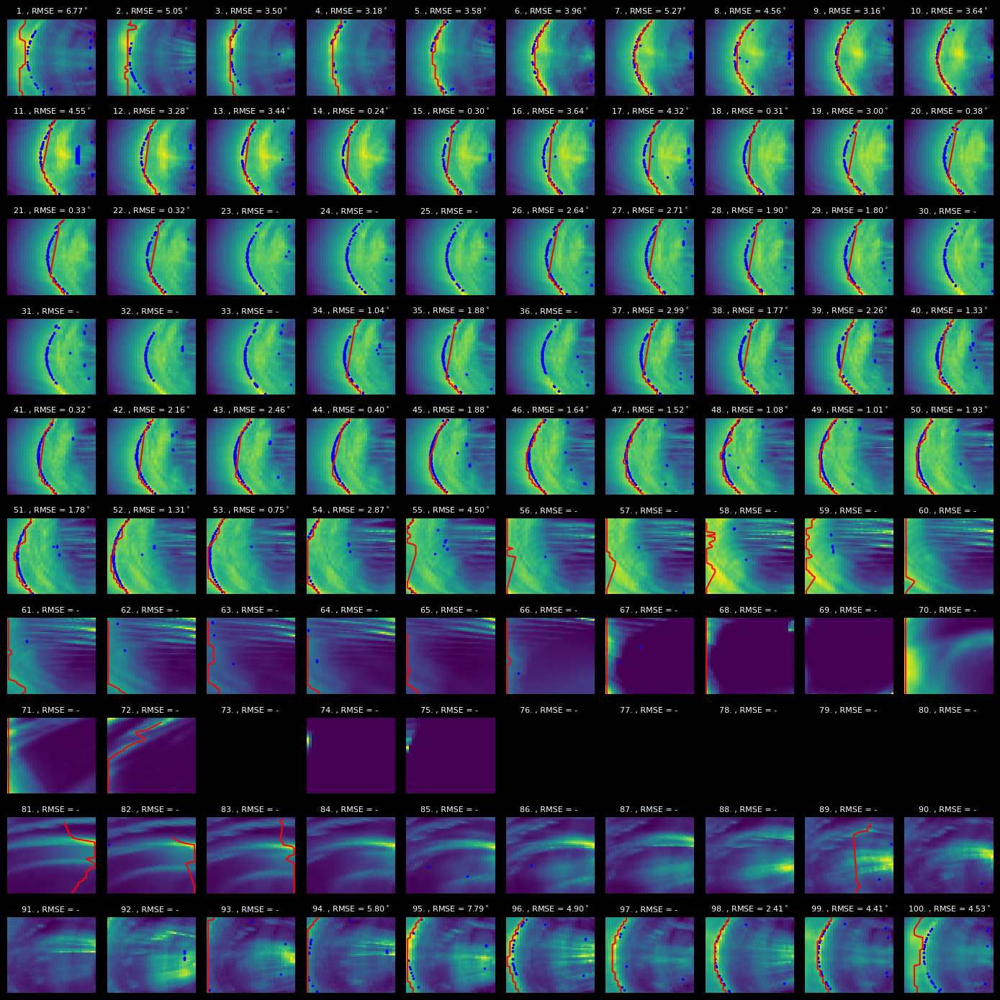

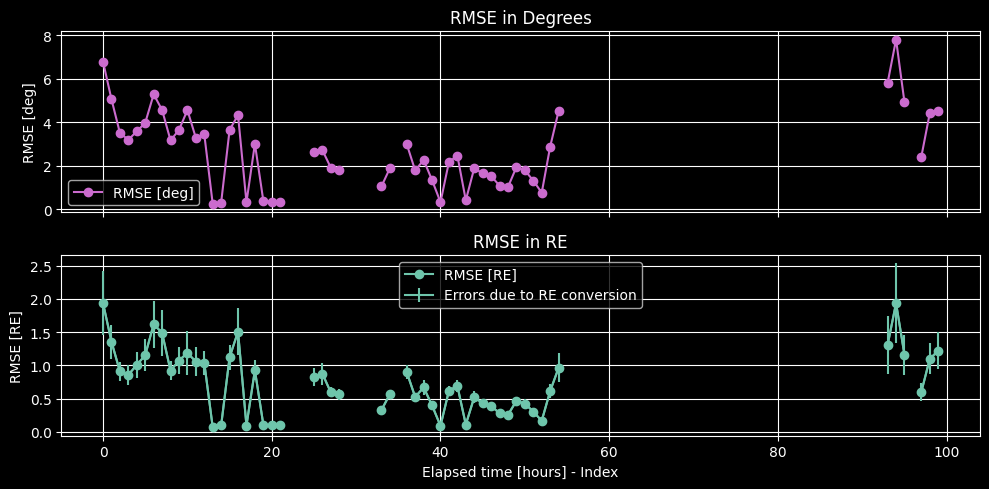

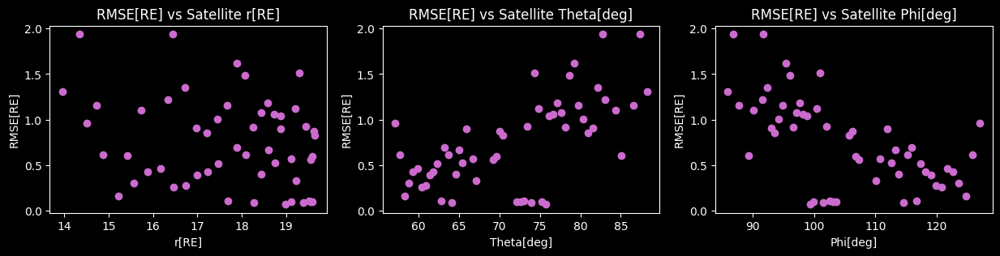

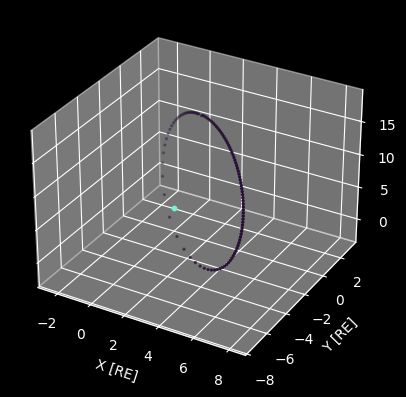

In [7]:
print("June 2025")
RMSE_RE_jun, r_sat_jun, phi_sat_jun, theta_sat_jun = orbit(jun_2025)

## Interpretation

In the June orbit we see the evolution of the RMSE, which shows agreement between the projection of the magnetopause surface, indicated with the blue points, and the maximum intensity arc of the image, indicated with the red line, is close to 0.1 RE for most of the orbit, going sufficiently below the 0.5 RE error that was set as a requirement for the SXI instrument. We also observe cases where the error peaks, where although the projection seems correct, the extraction of the maximum intensity line fails to capture the intended curve. Finally, when the satellite enters the magnetopause, no curve can be detected since the emissivity inside the magnetosphere is zero. In such cases we discard the measurement since this is a clear limitation of the TFA.

Moving to the winter months, we no longer have problems with tracing the maximum intensity line, however certain POVs show a clear problem with the magnetopause surface and its projection to the FOV. For November's obit there are cases where the projection shows no correlation with the expected shape. The inner arc is a projection of the indentation of the cusps. Our grid is quite sparse for such a rapid identation, leading to not representative gradients of the surface, at the point of the discontinuity. However, this also shows our inability to correlate the projection of the cusps with a distinct geometric feature of the images. Although the cusps are highly luminous, they are also localized, meaning that their emission is not integrated over a significant portion of the LOS. This results in structures that are noticeable in the integrated image, but not prominent or consistent enough to allow for the correlation of their projection with their position. In any case, the concept of the tangent hypothesis has its foundation on the integration of a relatively homogeneous emission over the maximum path - excluding thus bright but localized features.

The outer arc projection seen in some November snapshots is more difficult to interpret, and the orbit of the satellite during the winter months should be taken into account. To understand this projection, we shall take a look at the viewing angle of the 3D magnetopause surface, as shown in the summary of the projection problem in {numref}`fig:POV`. The interpretation of the inner arc clearly agrees with the projection of cusps here. The outer tangent to the surface however, seems to severely overestimate the position of the maximum intensity arc. This can be explained by going back to the conclusion {cite}`andi_2024` reached in his paper, where he examined a spherical homogeneously emitting surface and found the tangent hypothesis to hold true. However, when he introduced gradients to the emission, making some regions more luminous than others, the maximum intensity arc consistently underestimated the position of the tangent arc. It is also known that the subsolar point will be significantly more luminous than higher latitudes, due to the flux of the solar wind. The contribution from the integration of the high latitude emission is not enough to counter the emission gradient near the subsolar point, leading to the underestimation of the tangent position when the satellite exceeds a certain latitude. This is reflected in the correlation of this phenomenon with the winter orbits, as well as with the polar angle of the position of the satellite. We show this correlation in {numref}`theta-RMSE`, and we will further discuss it below.

```{figure} ./images/tangent_hypothesis/image.png
:name: fig:POV
Projection and arc extraction problems.
```
Looking into another summer orbit, during April 2026, we observe similar behavior with June 2025, where the projection of the surface displays no surprising components, however the extraction of the maximum intensity arc oftentimes fails. This is strongly correlated with the inclination during these months and the resulting POVs. {ref}`fig:POV` shows the corresponding viewing angles of the 3D surface for arc extraction problem. The contribution to the intensity of every part of the surface, makes it difficult to track a single and distinct maximum intensity arc. This is clearly reflected in the August snapshots, where the previously distinct arc is no longer a thin line. 


## Quantitative orbit corellation
We can run this for orbits covering a full year and correlate the orbit evolution with the validity of the tangent hypothesis:

June 2025


100%|██████████| 100/100 [00:14<00:00,  6.74it/s]


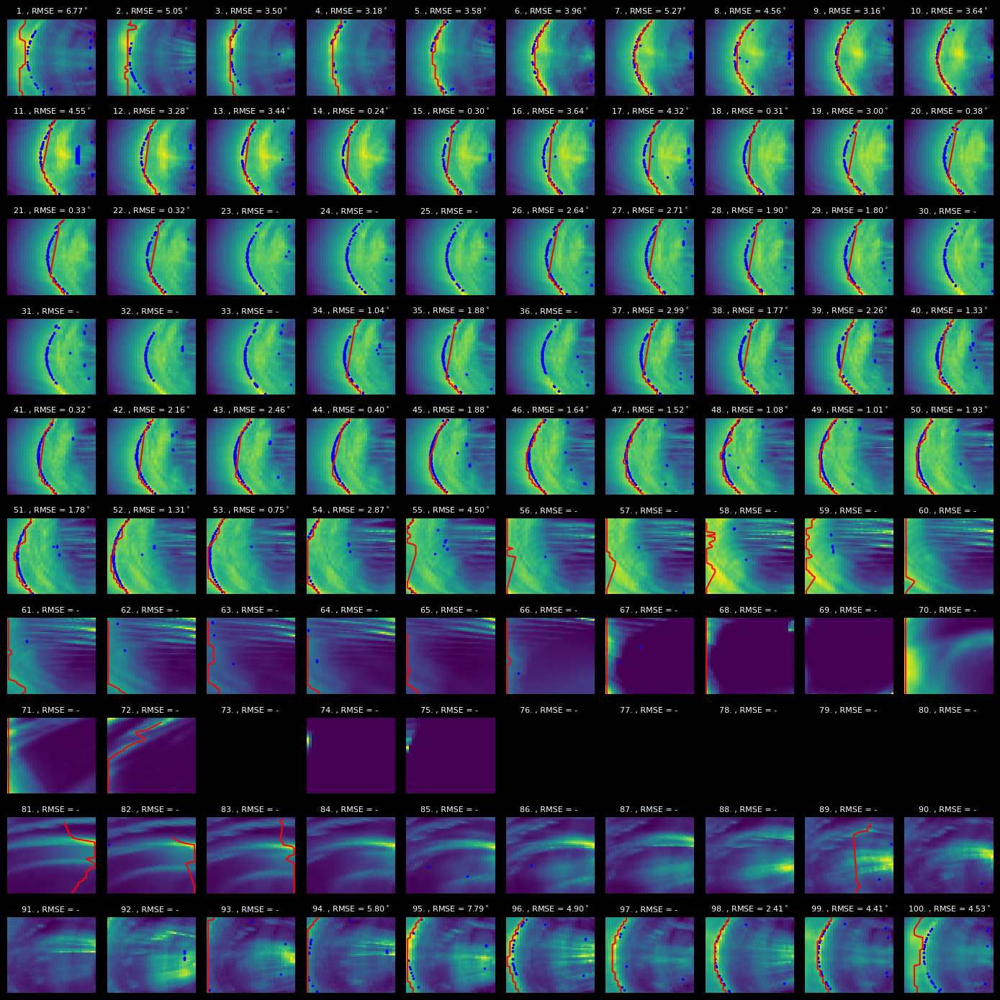

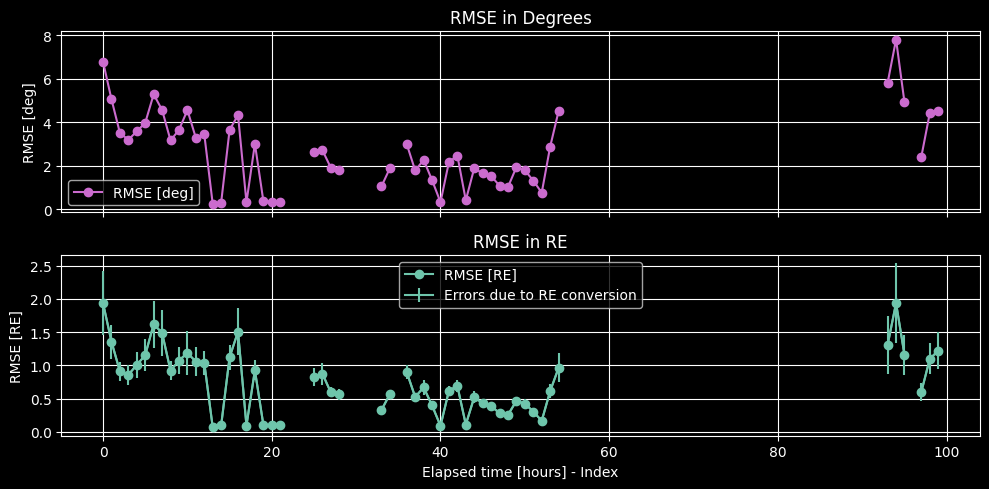

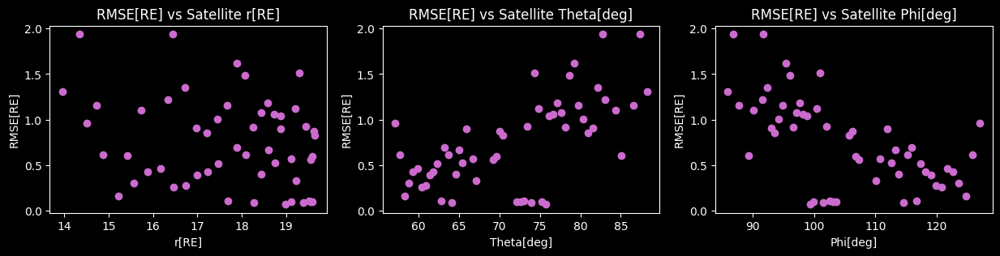

July 2025


100%|██████████| 100/100 [00:14<00:00,  6.71it/s]


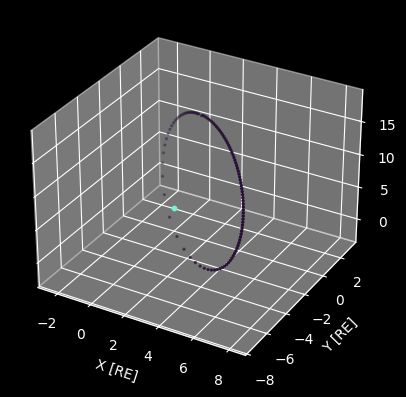

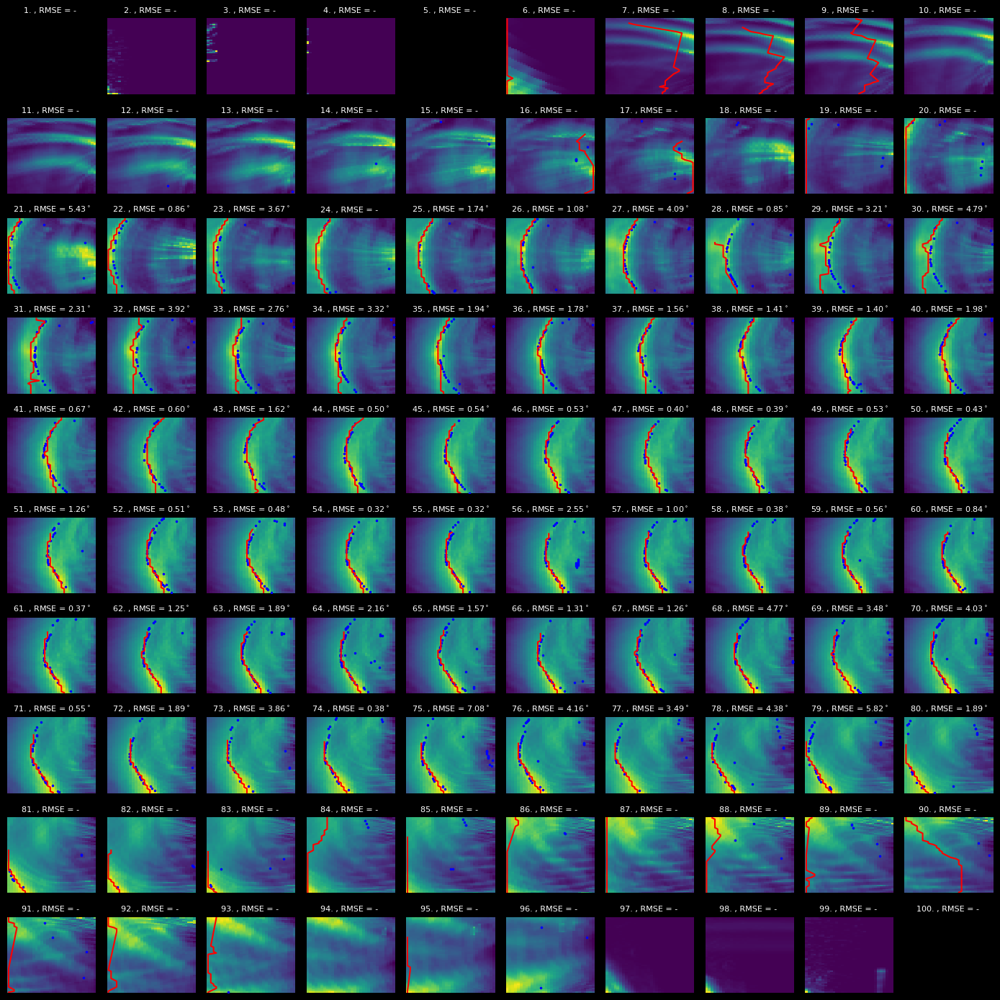

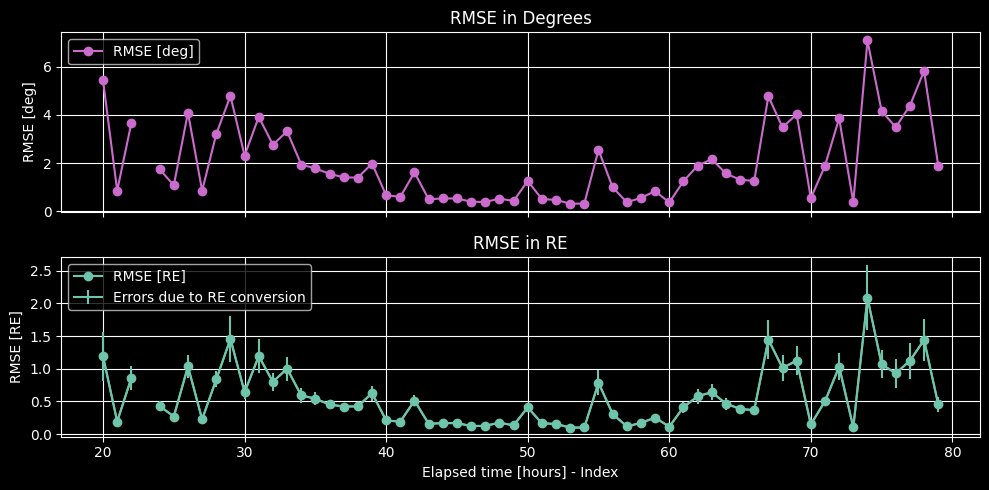

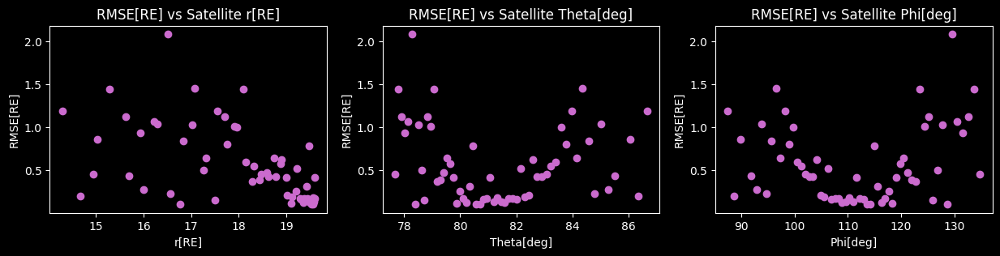

August 2025


100%|██████████| 100/100 [00:13<00:00,  7.39it/s]


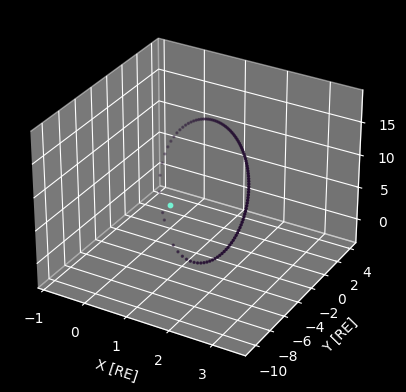

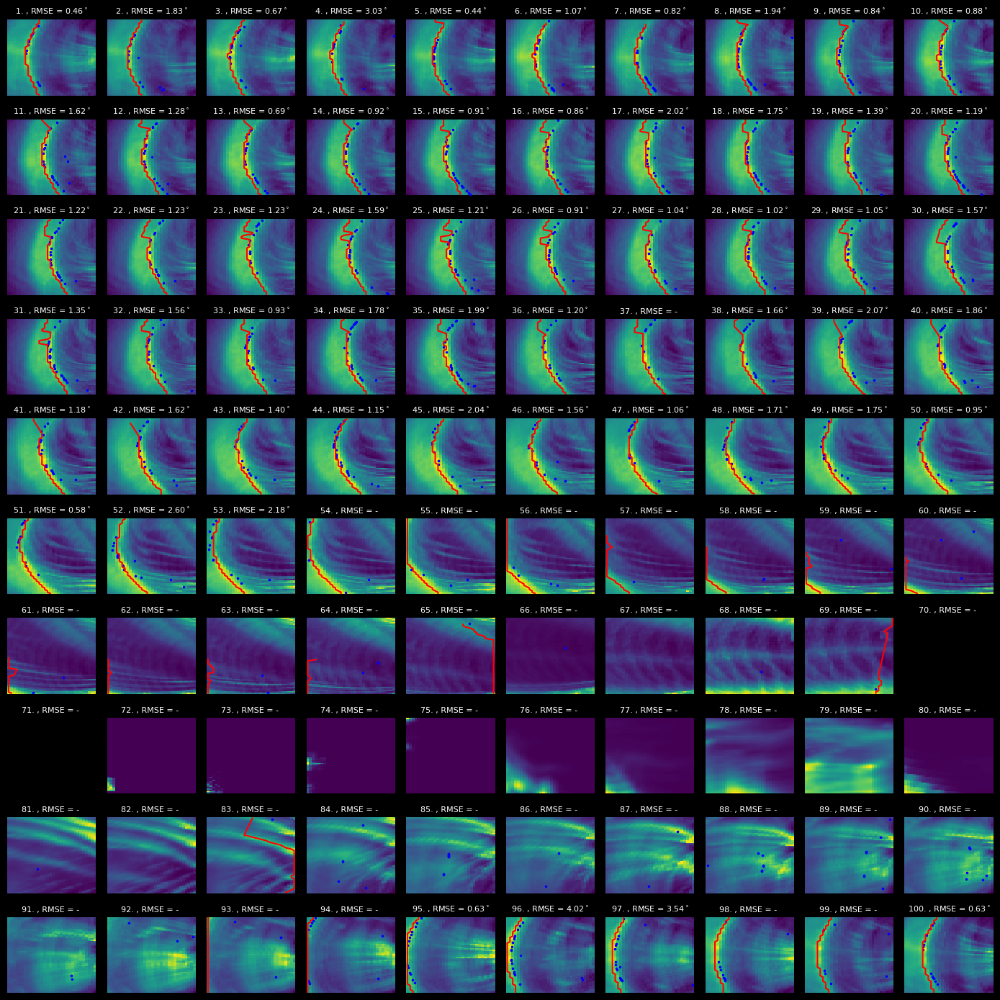

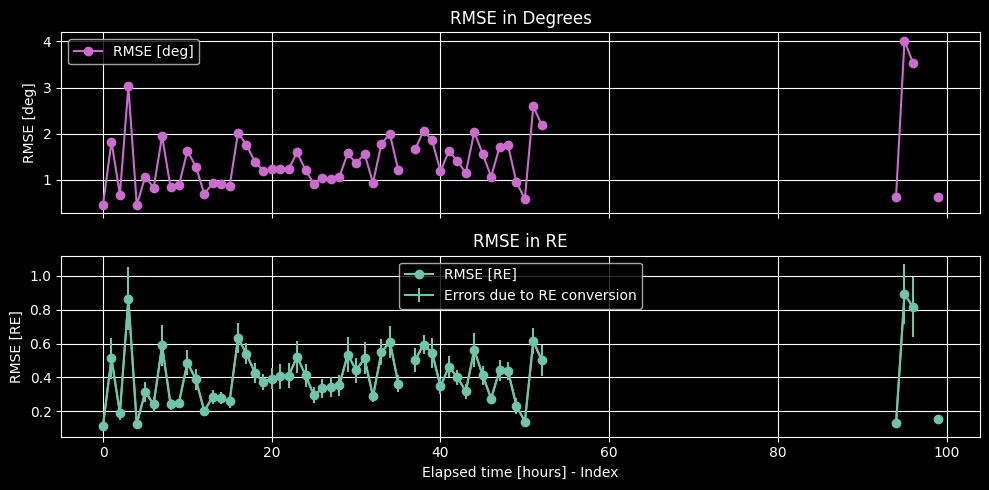

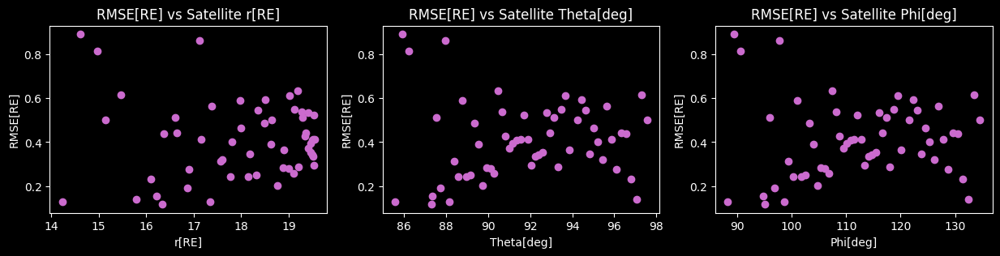

September 2025


100%|██████████| 100/100 [00:20<00:00,  4.91it/s]


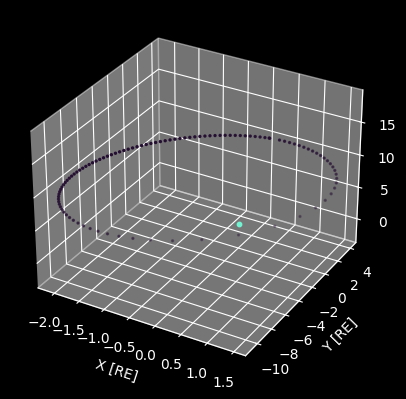

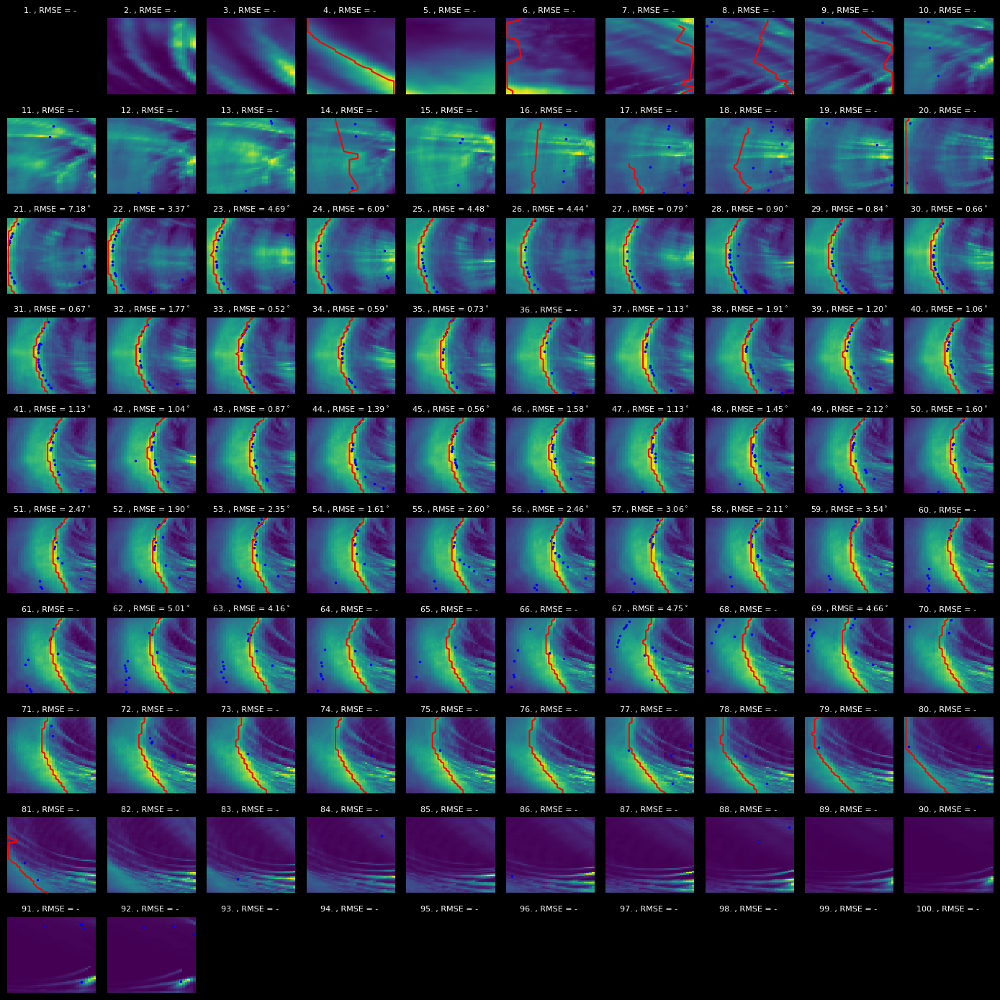

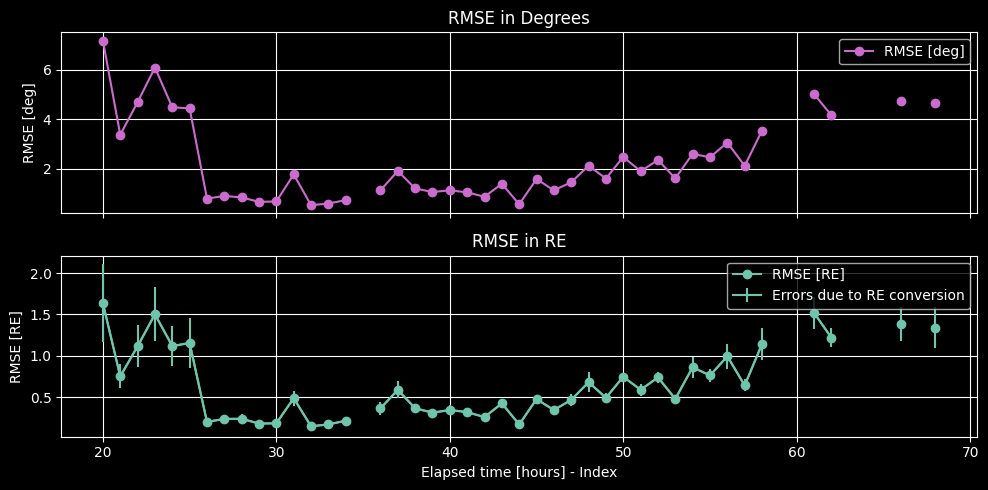

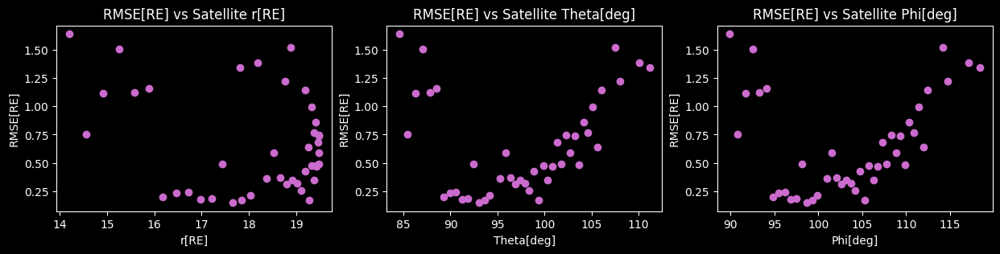

October 2025


100%|██████████| 100/100 [00:19<00:00,  5.17it/s]


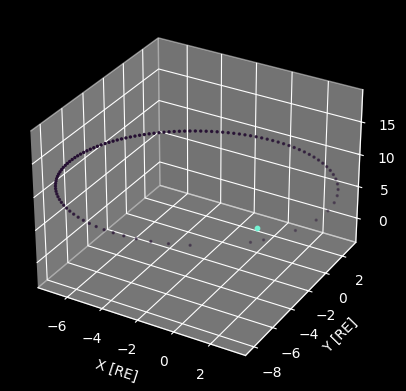

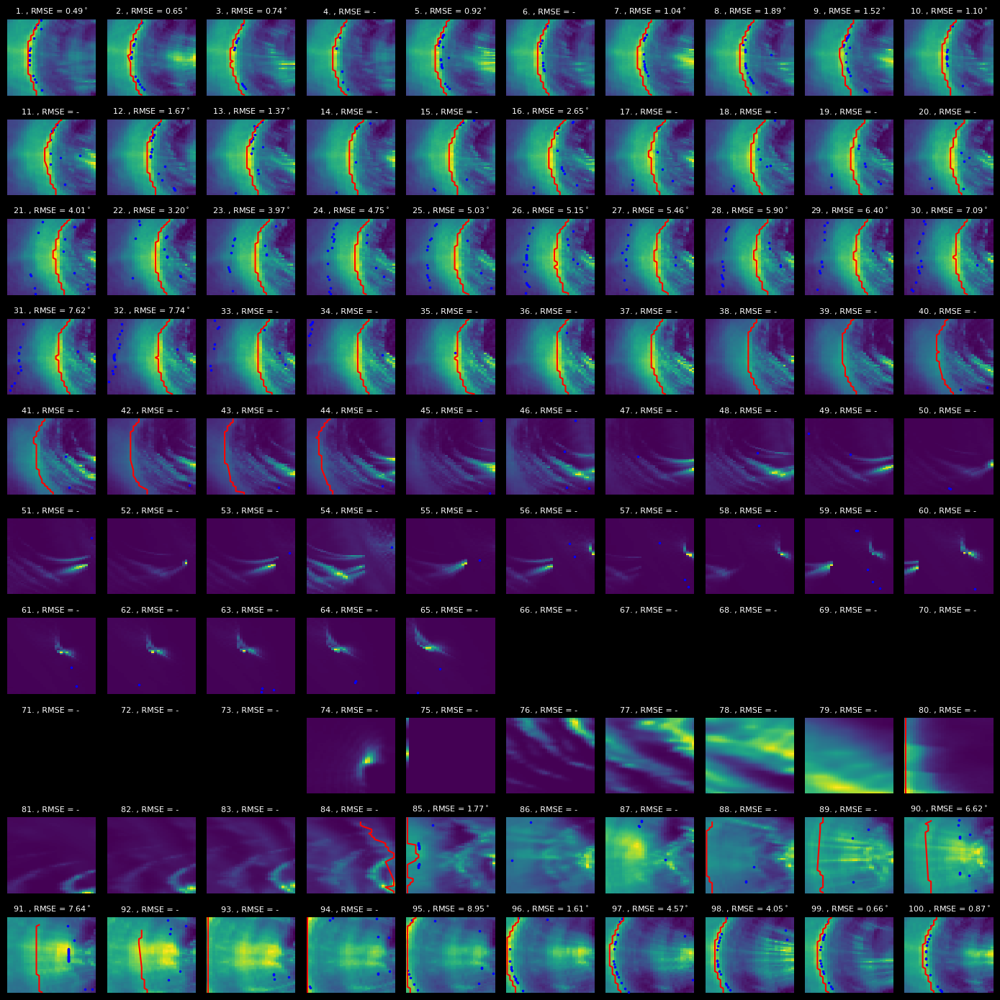

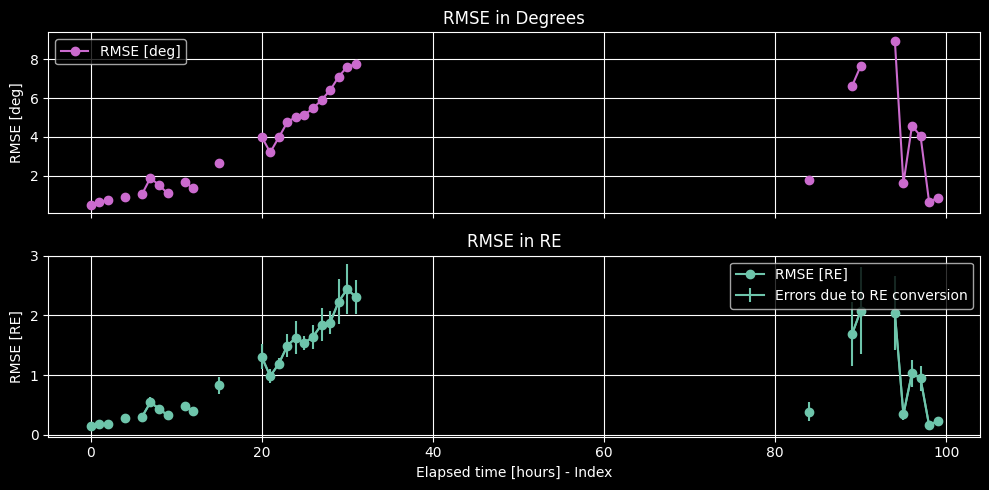

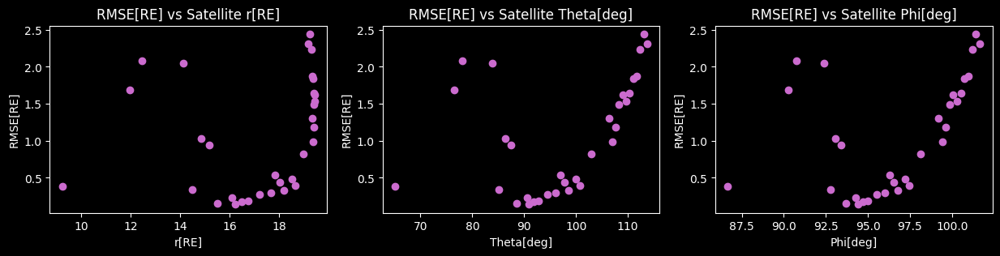

November 2025


100%|██████████| 100/100 [00:28<00:00,  3.55it/s]


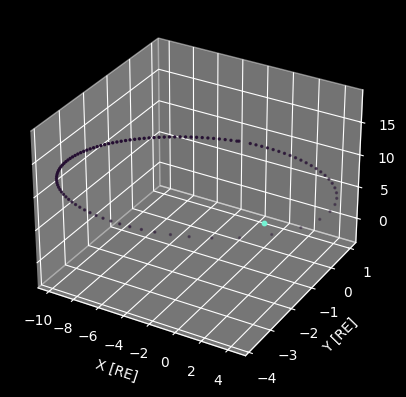

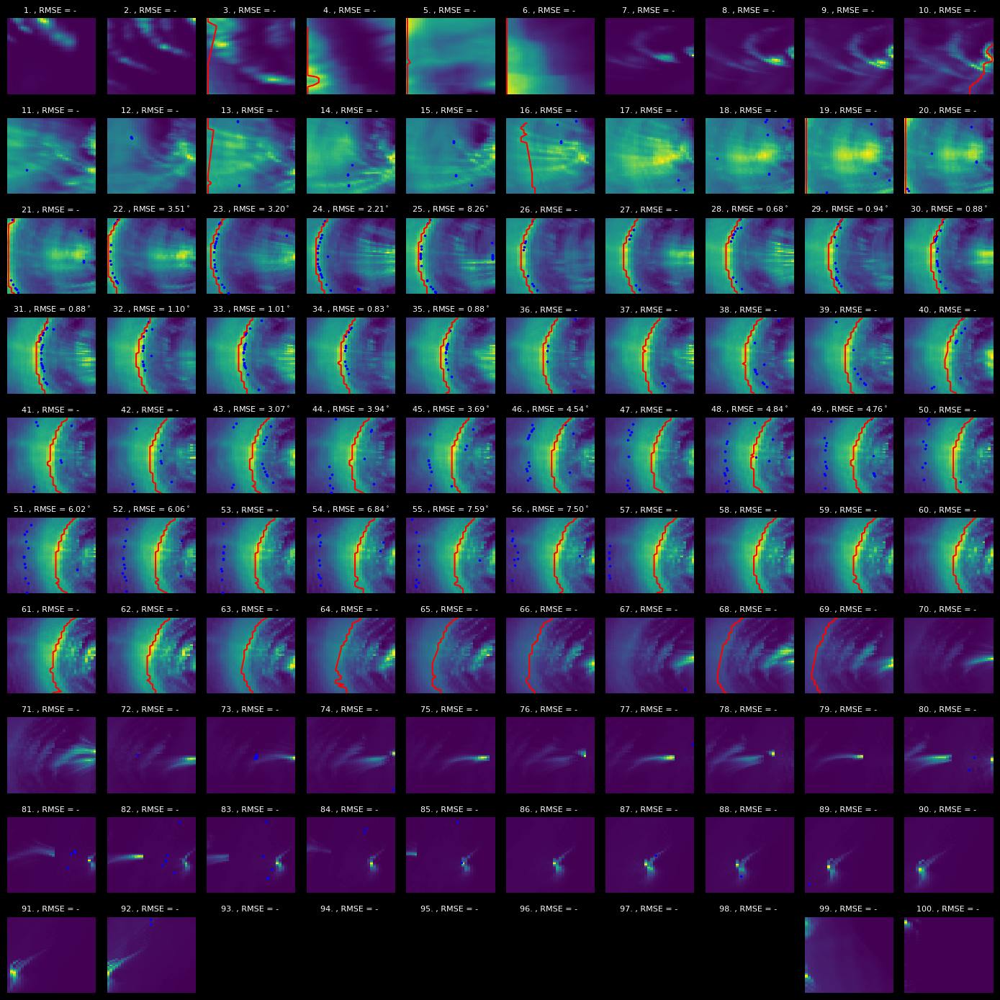

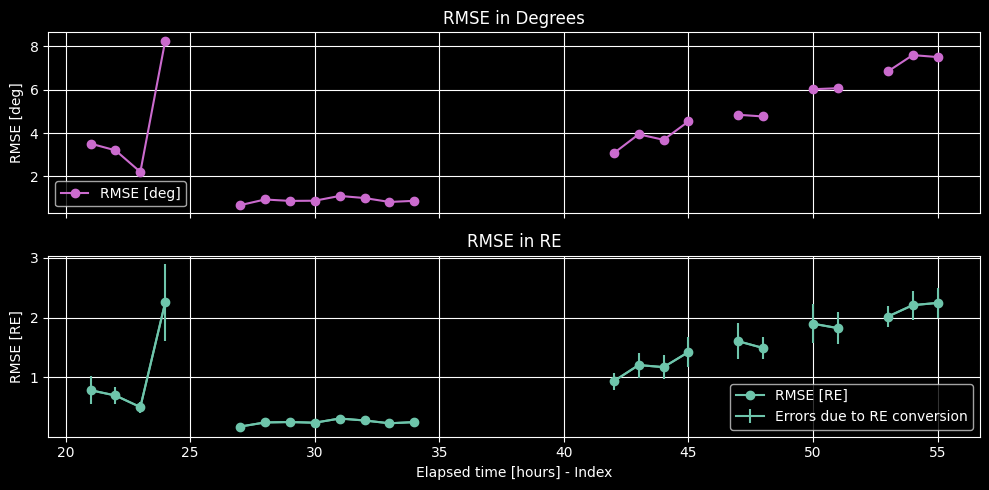

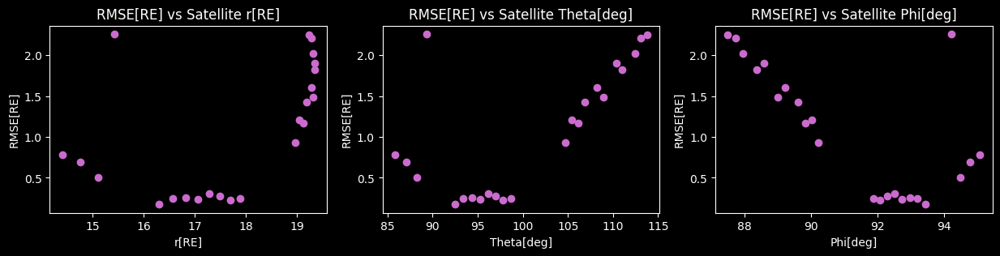

December 2025


100%|██████████| 100/100 [00:34<00:00,  2.89it/s]


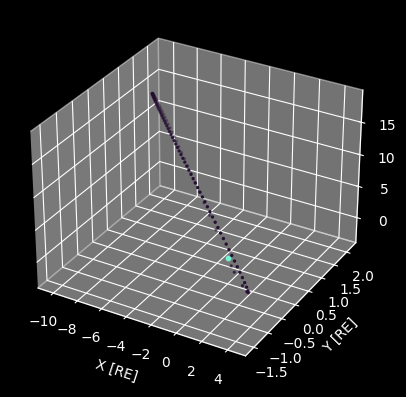

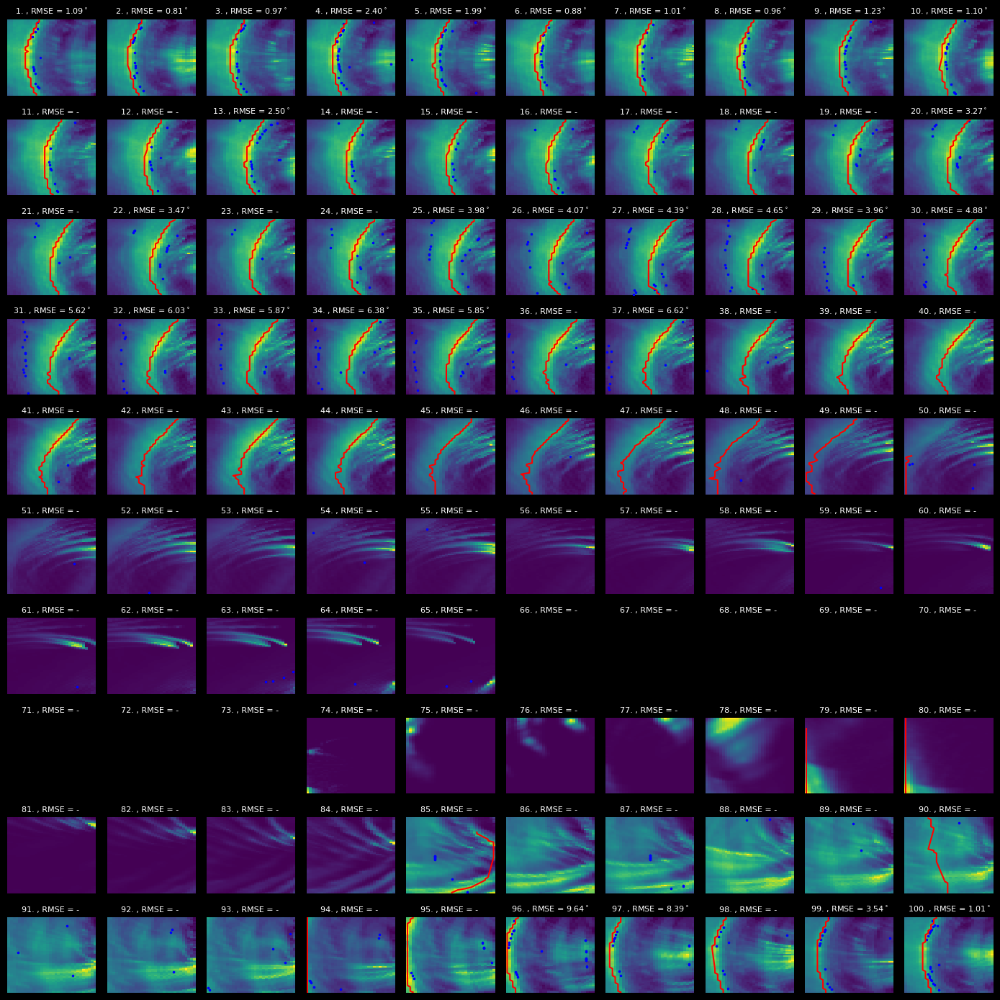

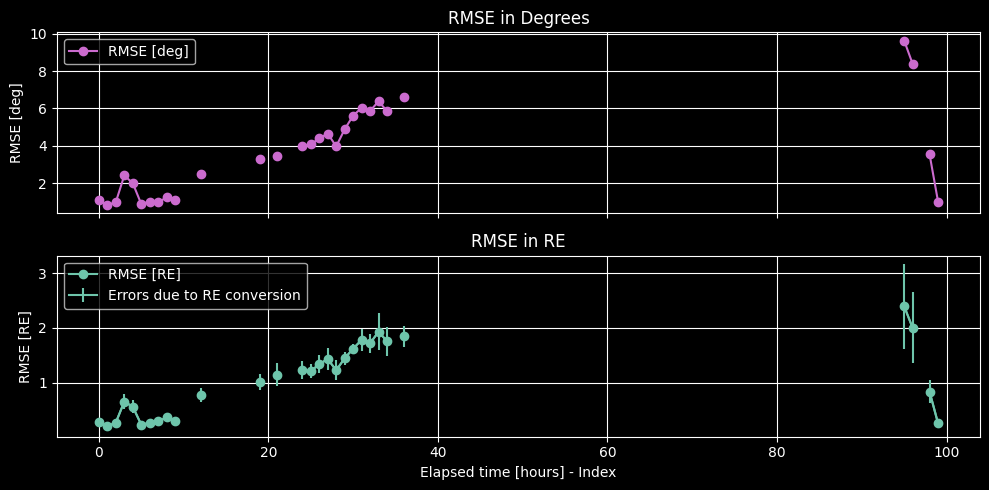

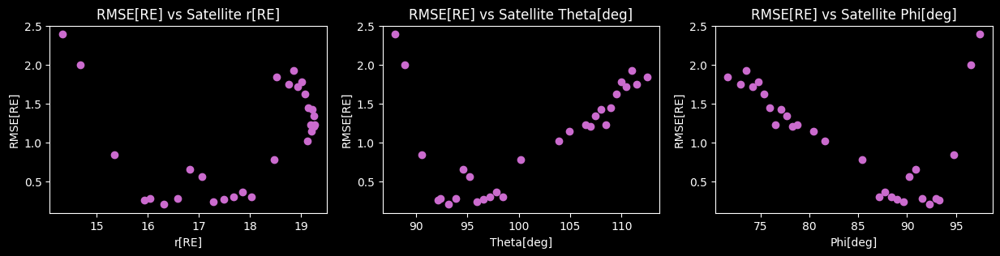

January 2026


100%|██████████| 100/100 [00:20<00:00,  4.87it/s]


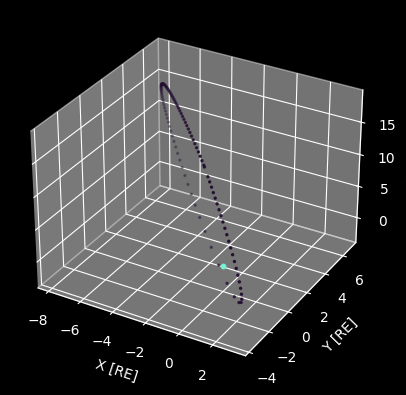

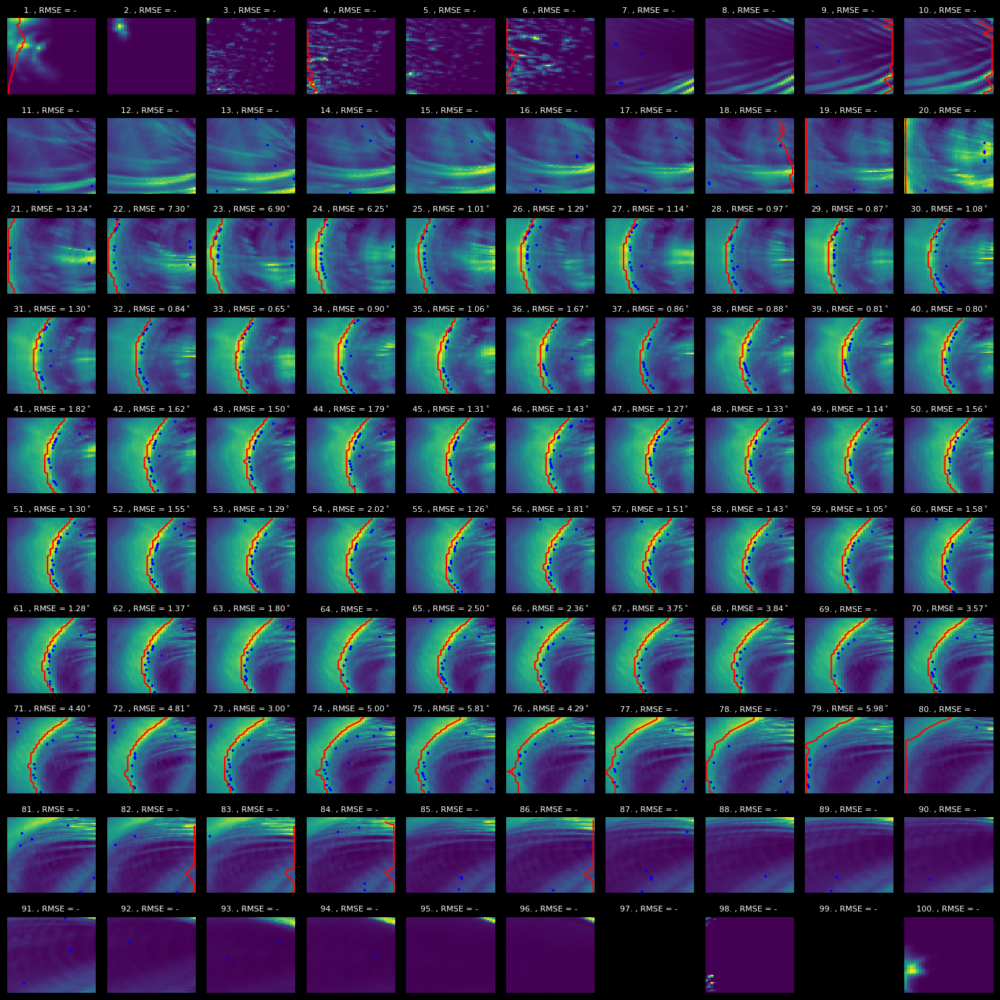

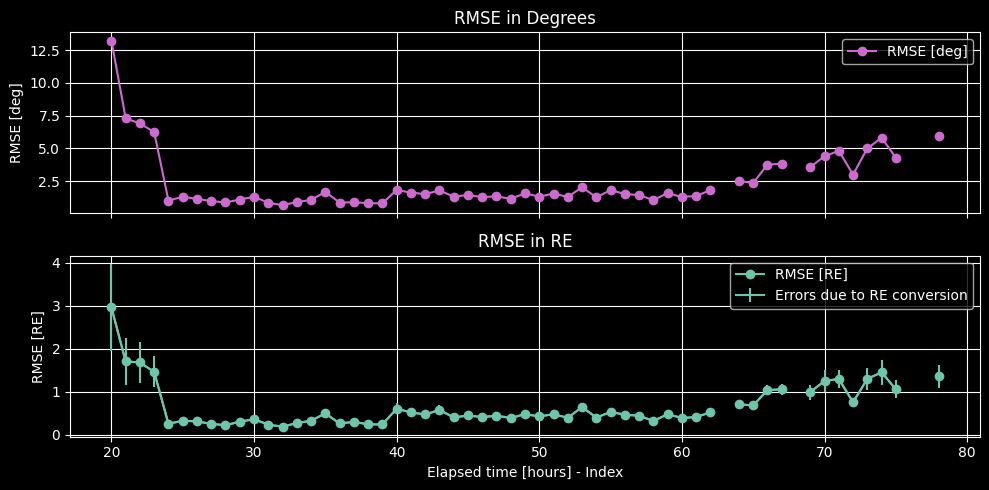

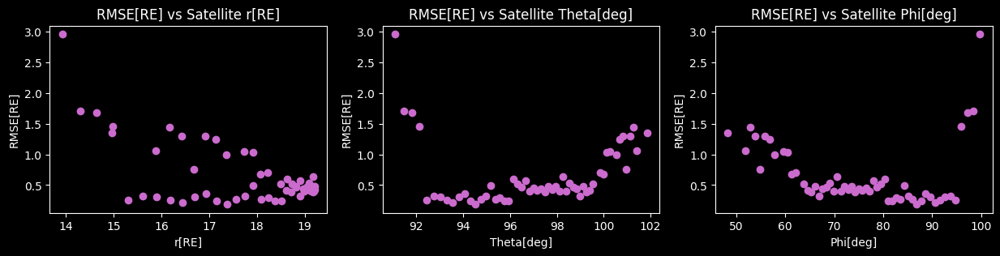

February 2026


100%|██████████| 100/100 [00:14<00:00,  6.75it/s]


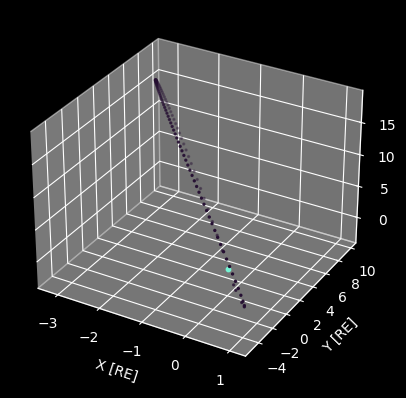

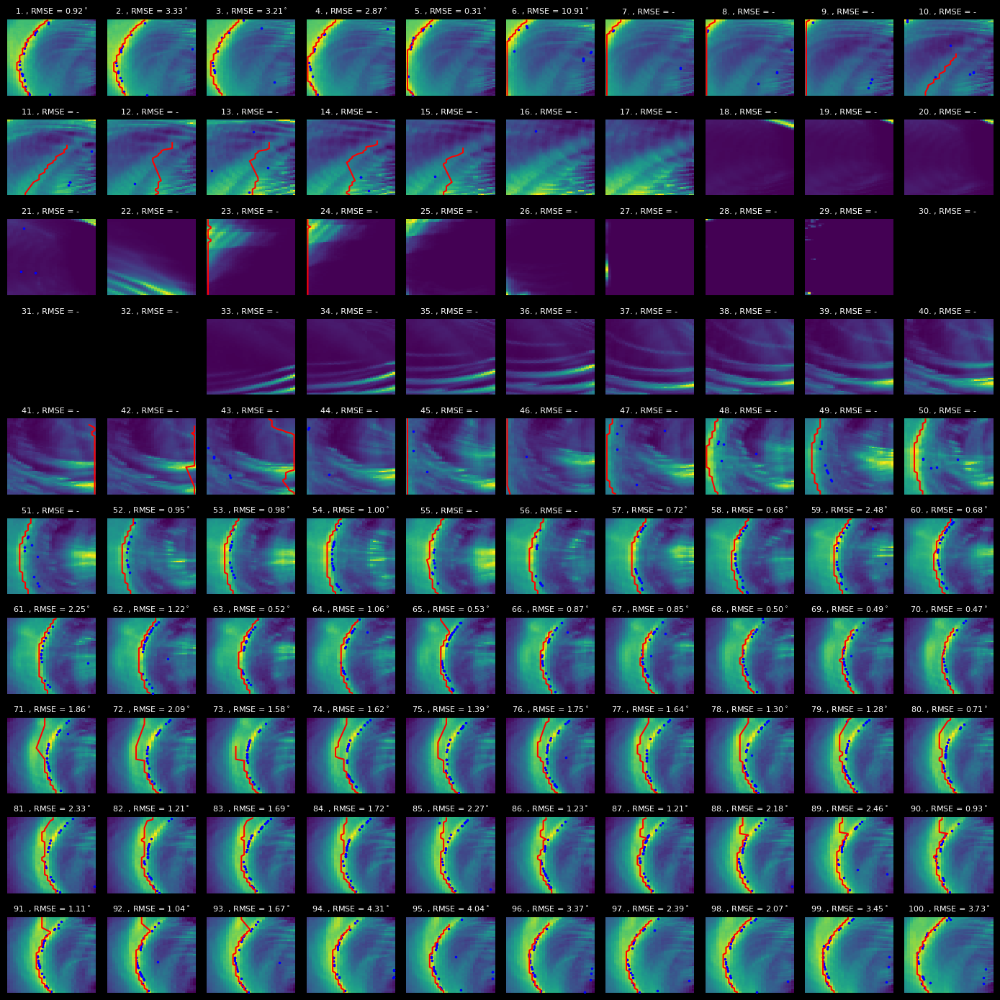

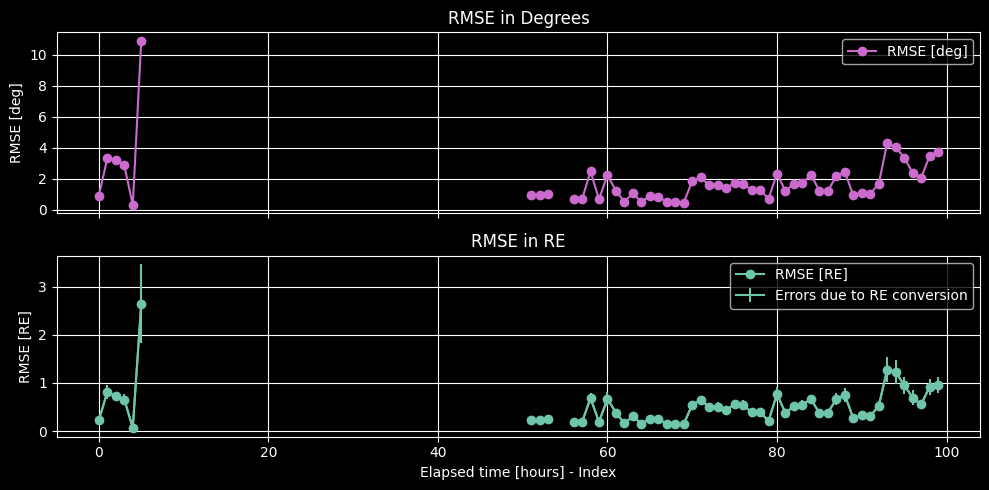

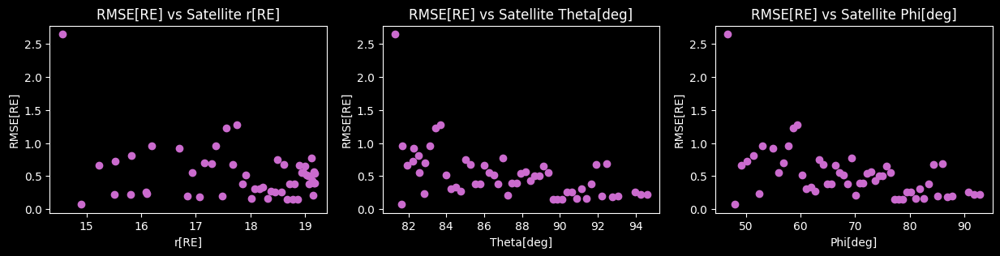

March 2026


100%|██████████| 100/100 [00:19<00:00,  5.02it/s]


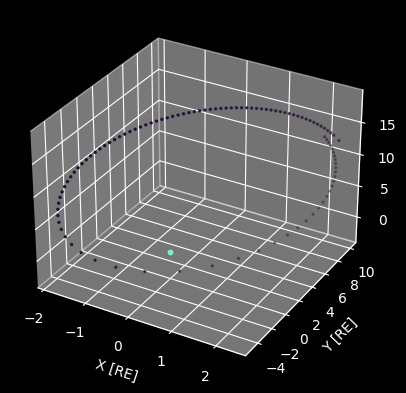

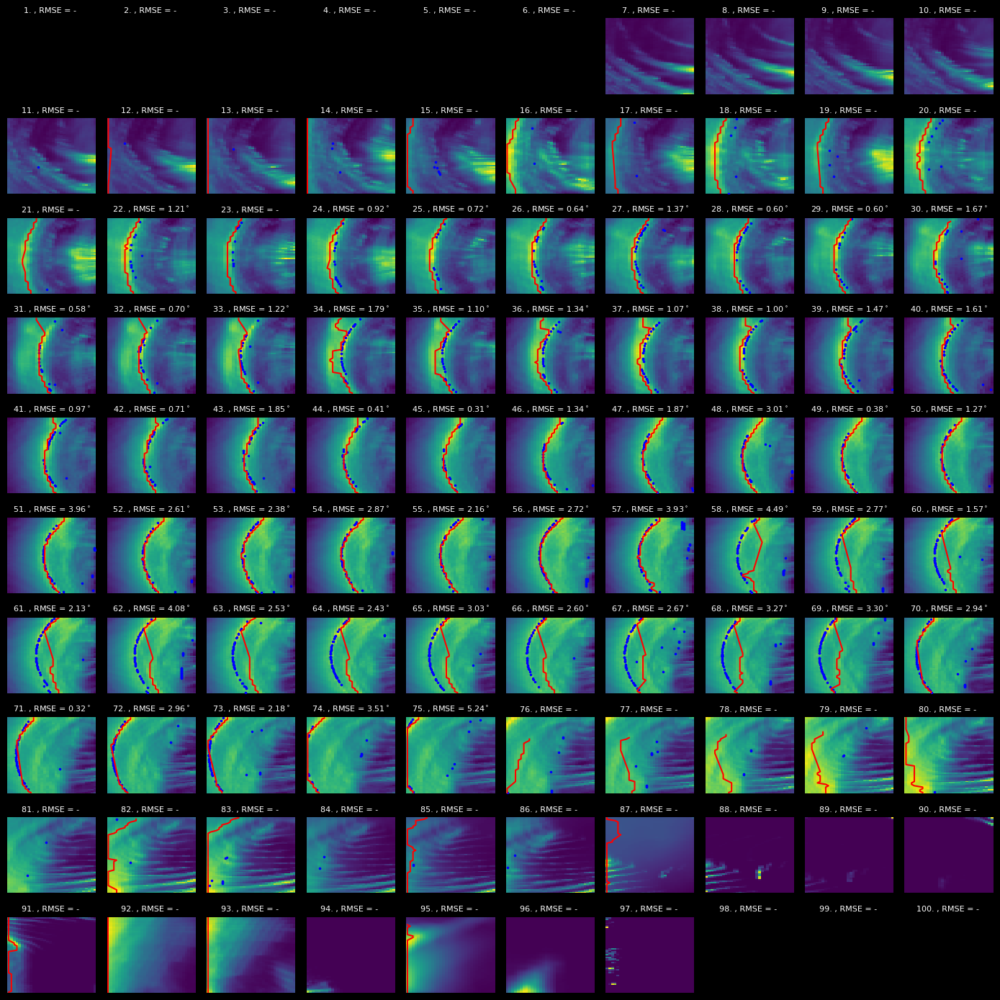

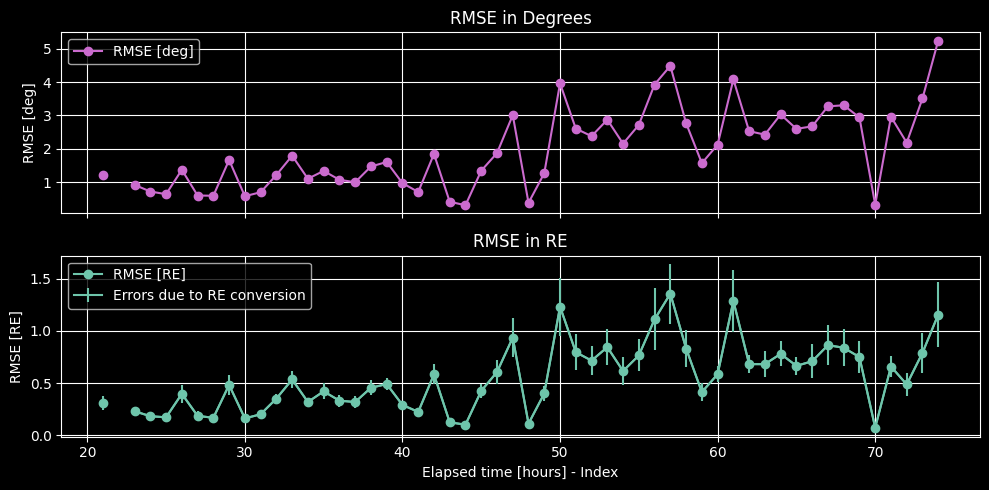

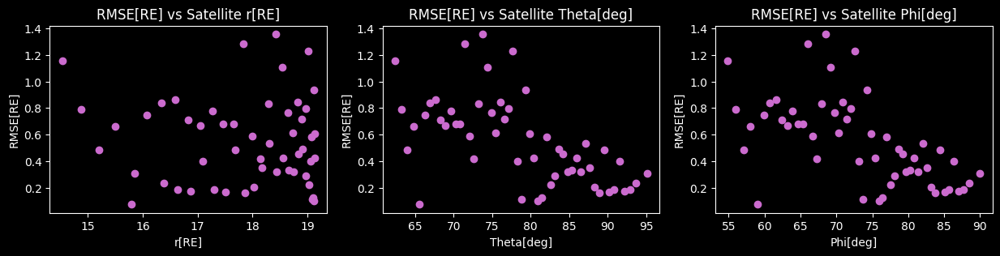

April 2026


100%|██████████| 100/100 [00:20<00:00,  4.89it/s]


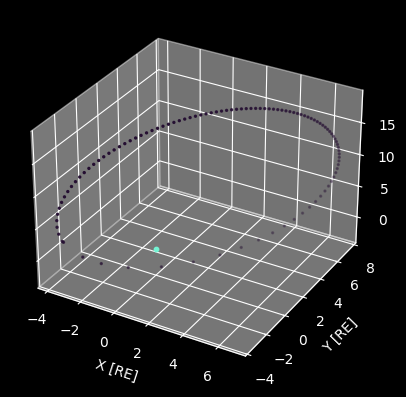

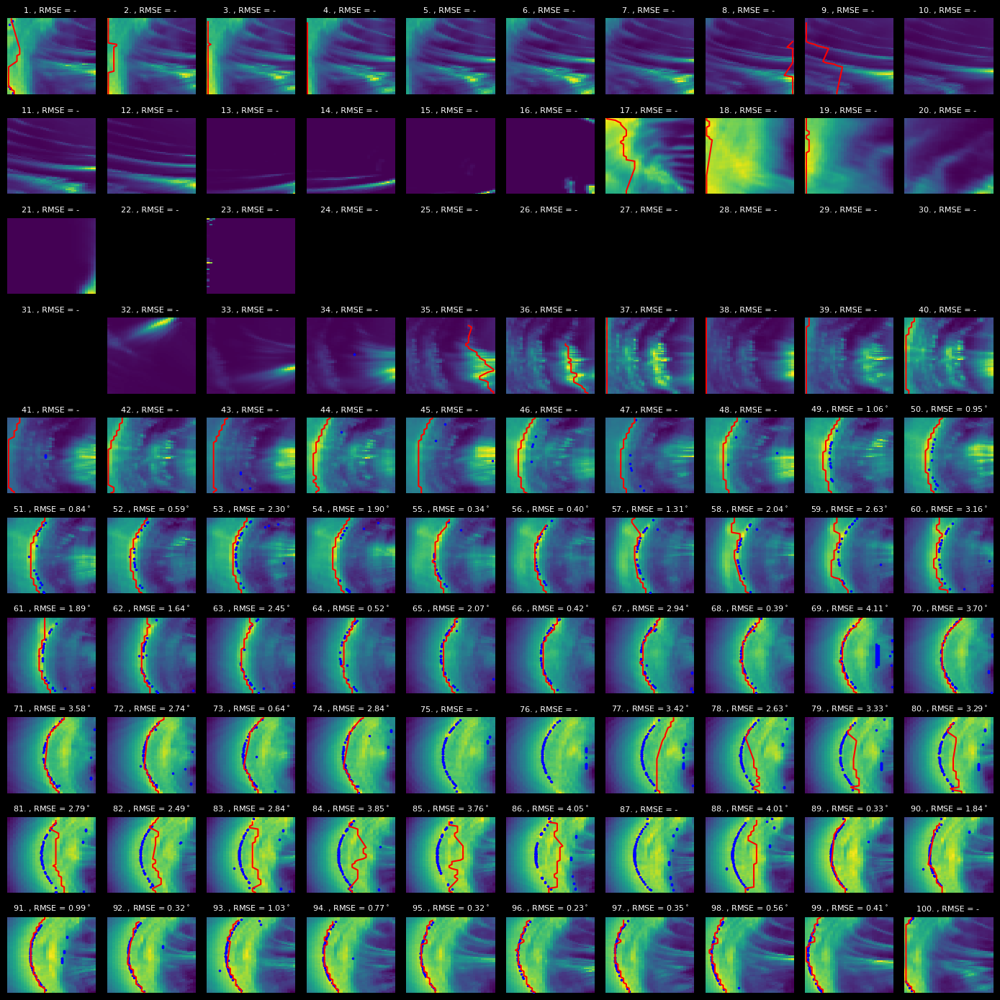

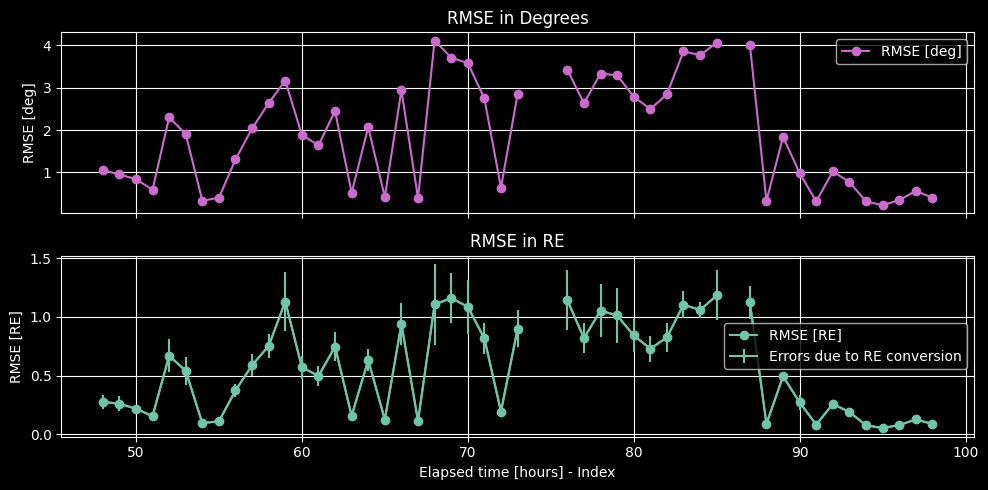

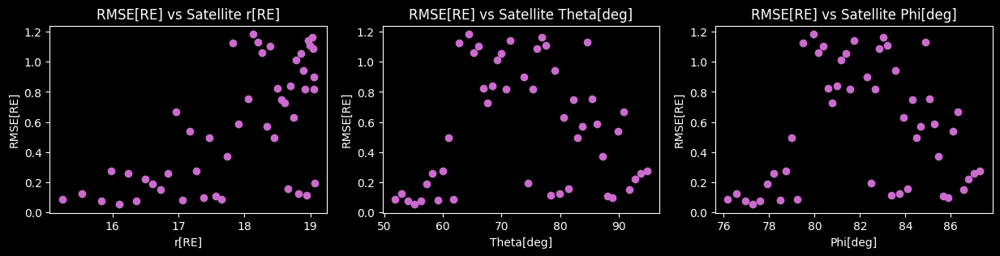

May 2026


100%|██████████| 100/100 [00:23<00:00,  4.25it/s]


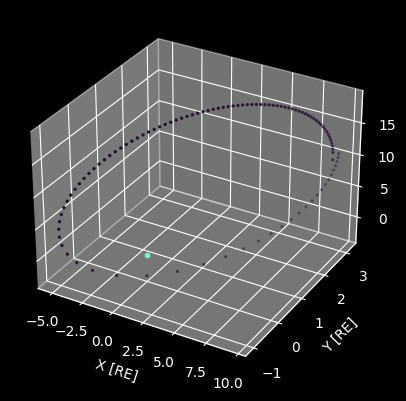

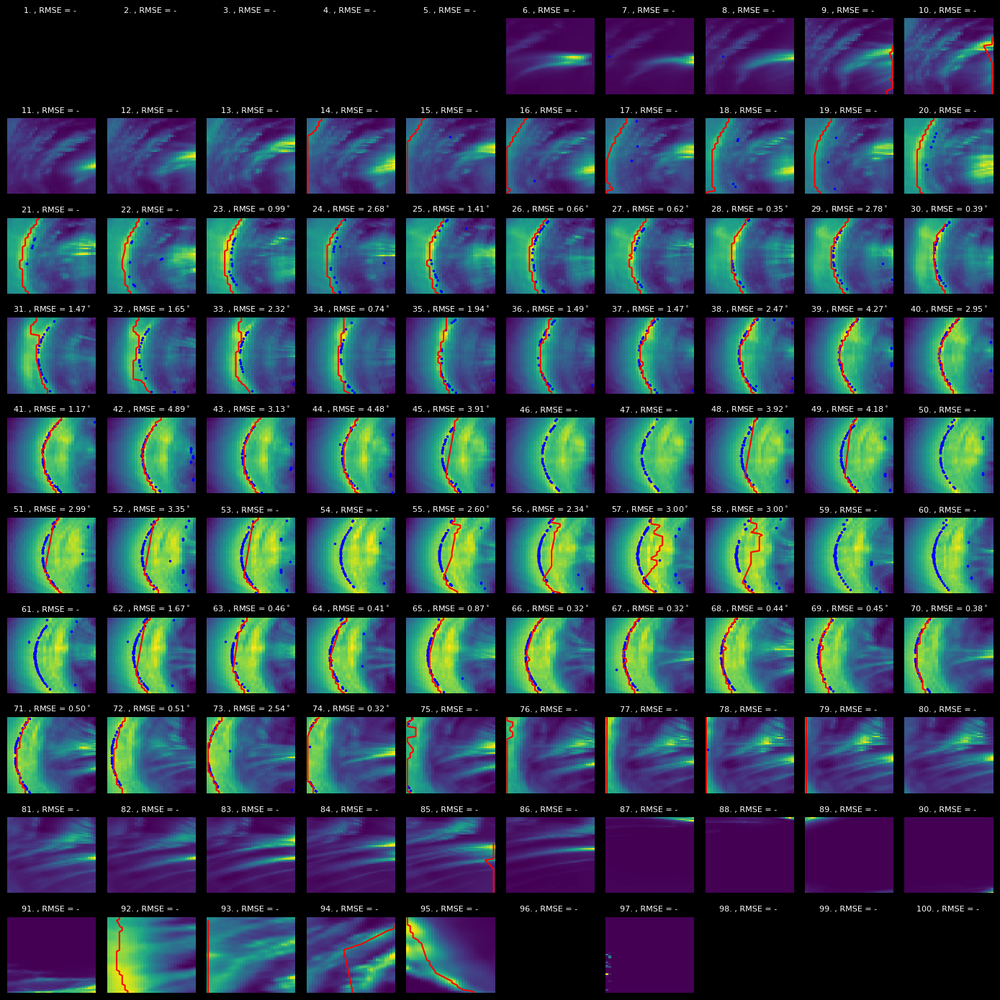

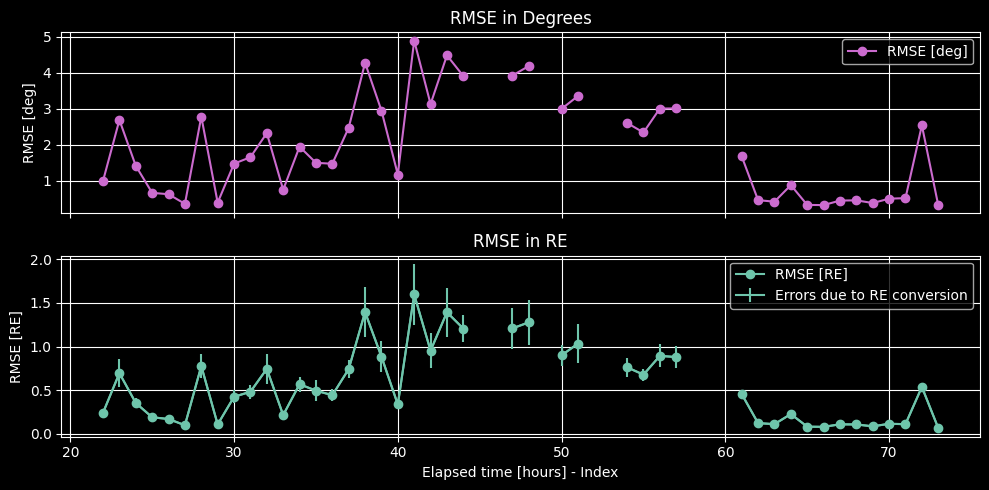

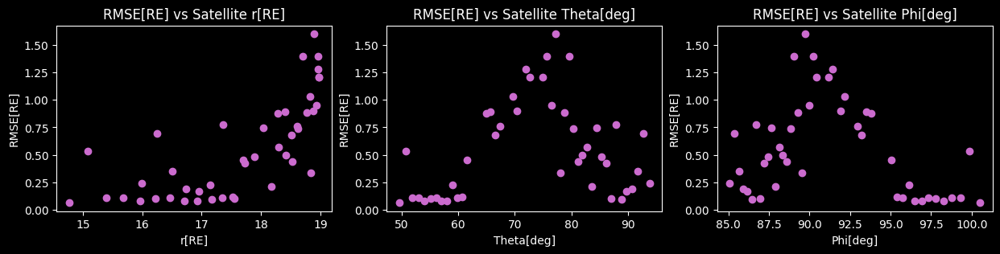

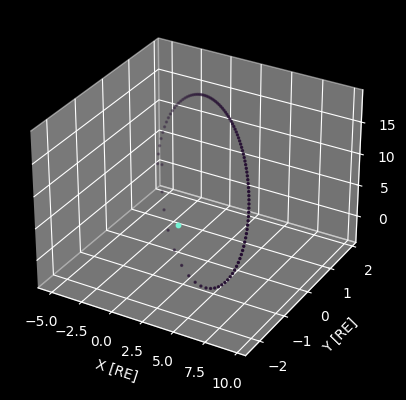

In [8]:
print("June 2025")
RMSE_RE_jun, r_sat_jun, phi_sat_jun, theta_sat_jun = orbit(jun_2025)
print("July 2025")
RMSE_RE_jul, r_sat_jul, phi_sat_jul, theta_sat_jul = orbit(jul_2025)
print("August 2025")
RMSE_RE_aug, r_sat_aug, phi_sat_aug, theta_sat_aug = orbit(aug_2025)
print("September 2025")
RMSE_RE_sept, r_sat_sept, phi_sat_sept, theta_sat_sept = orbit(sept_2025)
print("October 2025")
RMSE_RE_oct, r_sat_oct, phi_sat_oct, theta_sat_oct = orbit(oct_2025)
print("November 2025")
RMSE_RE_nov, r_sat_nov, phi_sat_nov, theta_sat_nov = orbit(nov_2025)
print("December 2025")
RMSE_RE_dec, r_sat_dec, phi_sat_dec, theta_sat_dec = orbit(dec_2025)
print("January 2026")
RMSE_RE_jan, r_sat_jan, phi_sat_jan, theta_sat_jan = orbit(jan_2026)
print("February 2026")
RMSE_RE_feb, r_sat_feb, phi_sat_feb, theta_sat_feb = orbit(feb_2026)
print("March 2026")
RMSE_RE_mar, r_sat_mar, phi_sat_mar, theta_sat_mar = orbit(mar_2026)
print("April 2026")
RMSE_RE_apr, r_sat_apr, phi_sat_apr, theta_sat_apr = orbit(apr_2026)
print("May 2026")
RMSE_RE_may, r_sat_may, phi_sat_may, theta_sat_may = orbit(may_2026)

```{figure} ./images/tangent_hypothesis/3DView.png
:align: right
:scale: 40%
:name: theta-RMSE
High satellite $\theta$ angle viewing geometry.
```
While, correlating the above orbits, as well the orbits for each month that are not explicitly discussed here, we see a clear dependency on the polar angle of the satellite's position. We notice that the error rapidly increases when the satellite is in the nightside, while there is no detection below $50^\circ$ polar angle. The latter is to be expected, as we approach and enter the magnetopause for lower angles. We discussed previously the bias that the emission gradients could impose on the detection of the tangent direction. Here we see that for angles larger than $90^\circ$ - when the satellite is in the nightside - this bias becomes rapidly important and the tangent hypothesis fails. 


By examining the simulation cube range, we see that this bias is not only attributed to the physical gradients, but also to the simulation restrictions. The simulation cube is restricted to $z\in[-10,10]\, RE$, meaning that any emission outside this range is not captured in the integrated images. At the same time the magnetopause surface is constructed directly from the emission data of the simulation cube, meaning that the projected surface is limited in $\theta\in[-65,65]^\circ$. For a full characterization of the high latitude angles, a simulation box to encapsulate all satellite positions and orbits will be necessary.



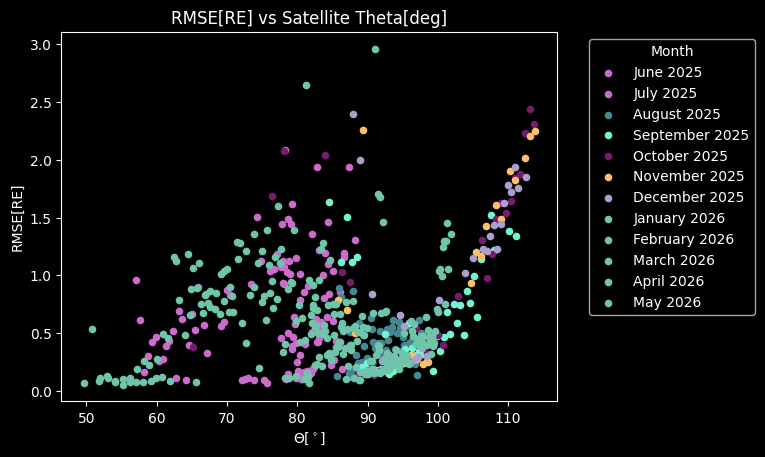

In [9]:
plt.scatter(np.degrees(theta_sat_jun), RMSE_RE_jun, label='June 2025', color=palette(1), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_jul), RMSE_RE_jul, label='July 2025', color=palette(1), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_aug), RMSE_RE_aug, label='August 2025', color=palette(2), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_sept), RMSE_RE_sept, label='September 2025', color=palette(3), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_oct), RMSE_RE_oct, label='October 2025', color=palette(4), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_nov), RMSE_RE_nov, label='November 2025', color=palette(5), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_dec), RMSE_RE_dec, label='December 2025', color=palette(6), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_jan), RMSE_RE_jan, label='January 2026', color=palette(7), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_feb), RMSE_RE_feb, label='February 2026', color=palette(8), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_mar), RMSE_RE_mar, label='March 2026', color=palette(9), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_apr), RMSE_RE_apr, label='April 2026', color=palette(10), marker='o', s=20)
plt.scatter(np.degrees(theta_sat_may), RMSE_RE_may, label='May 2026', color=palette(11), marker='o', s=20)
plt.legend(title="Month", loc='upper left', bbox_to_anchor=(1.05, 1))
plt.title("RMSE[RE] vs Satellite Theta[deg]")
plt.xlabel("$\Theta[^\circ]$")
plt.ylabel("RMSE[RE]")
plt.show()

(definition_probelms)=
## Discussion: Definition of the magnetopause

We pointed out earlier that we cannot extract meaningful information from the projection of the cusps in the image using the TFA. In other words, the use of a magnetopause model with strong cusp indentation does not represent the curve of the maximum intensity, that we want to fit. This opens the conversation on the definition of the magnetopause surface and the disagreement with the extracted surface, that we noticed in {ref}`fitting_models`. When trying to fit empirical models, it was evident that their shape could not describe the discontinuous surface of the maximum intensity, nor the discontinuity predicted by the pressure equilibrium equation {eq}`pressure_eq`. 

{cite}`nguyen4` re-enforces this disagreement by concluding that the Lin model overestimates the identation of the cusps, when for the case of our extracted surface, every model severely underestimates it. In the last paper of his series, he explains the selection criteria for the crossings in the cusp region. He indicates the existence of two barriers - the inner and the outer cusp - and chooses the latter to perform the statistical analysis. This may be correlated with the second maximum emissivity of the 3D cube in that region, and further tests on the surface extraction shall be performed to understand how the empirical models correlate with the simulation results. 
Further metrics shall also be tested, emphasizing the dependency on the electromagnetic fields instead of the emission. The extraction of the magnetopause through the current sheet would be of particular interest, since its theoretical shape seems to better align with the empirical models. Future efforts shall concentrate on extracting the outer boundary, rejecting the inner cusp and defining coherently the magnetopause surface.  